In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from tqdm import tqdm_notebook
from datetime import datetime
from collections import Counter
from zipfile import ZipFile
import warnings
warnings.filterwarnings('ignore')

orange, purple, elm, grey ='#FFCC00', '#666599', '#217C7E', '#F5F5F5'

color_p = {'news':elm,
           'blogs':orange,
           'discussions':purple}   

themes = ['medical supplies','ppe','recommendations','restrictions','seasonal flu']

themes_dict = {
            'medical supplies':'Medical Supplies',
            'ppe':'PPE',
            'recommendations':'Recommendations',
            'restrictions':'Restrictions',
            'seasonal flu':'Seasonal Flu'}

metric_labels = {'discrep':'Discrepancies', 
                 'tentat':'Tentative', 
                 'certain':'Certainty', 
                 'focuspast':'Past focus', 
                 'focuspresent':'Present Focus',
                 'focusfuture':'Future Focus'}

__author__ = 'Haomin Lin'
__version__ = 'Python3'

In [3]:
path_info_ana = '../src/Data/info_ana.csv'
info_ana = pd.read_csv(path_info_ana,index_col=0)
info_ana['date'] = [datetime.strftime(pd.to_datetime(date), '%Y-%m-%d') for date in tqdm_notebook(info_ana['date'])]

In [4]:
info_ana_news = info_ana[info_ana['platform']=='news']
info_ana_blog = info_ana[info_ana['platform']=='blogs']
info_ana_disc = info_ana[info_ana['platform']=='discussions']
info_metric = {'news':info_ana_news,
               'blogs':info_ana_blog,
               'discussions':info_ana_disc}

In [5]:
# Assign data for all dates
dates = sorted(list(set(info_news['date']).union(set(info_blog['date'])).union(set(info_disc['date']))))[1:-1]
dates_ = [date[5:].replace('-','/') for date in dates]

In [6]:
discr_metrics_platform = {}
daily_metrics_platform = {}
for label in tqdm_notebook(metric_labels):
    metrics_discr = {}
    metric_daily = {}
    for p in info_metric:
        metrics_discr[p] = info_metric[p][label]
        metric_platform = info_metric[p][['date',label]].groupby('date').agg('mean').to_dict()[label]
        daily_metrics_map = {}
        for date in sorted(set(info_ana['date'])):
            daily_metrics_map[date] = metric_platform.get(date, 0)
        metric_daily[p] = pd.Series(daily_metrics_map).rolling(7).mean()
    discr_metrics_platform[label] = metrics_discr
    daily_metrics_platform[label] = metric_daily

In [7]:
discr_metrics_platform_themes = {}
daily_metrics_platform_themes = {}
for label in tqdm_notebook(metric_labels):
    metrics_discr = {}
    metric_daily = {}
    for p in info_metric:
        metrics_themes_discr = {}
        metric_themes_daily = {}
        for t in themes:
            theme_metric = info_metric[p][info_metric[p]['topic'].str.contains(t)]
            metrics_themes_discr[t] = theme_metric[label]
            metric_platform = theme_metric[['date',label]].groupby('date').agg('mean').to_dict()[label]
            daily_metrics_map = {}
            for date in sorted(set(info_ana['date'])):
                daily_metrics_map[date] = metric_platform.get(date, 0)
            metric_themes_daily[t] = pd.Series(daily_metrics_map).rolling(7).mean()
        metrics_discr[p] = metrics_themes_discr
        metric_daily[p] = metric_themes_daily
    discr_metrics_platform_themes[label] = metrics_discr
    daily_metrics_platform_themes[label] = metric_daily

In [8]:
days = [i[5:] for i in (list(daily_metrics_platform_themes['affect']['news']['ppe'].keys()))]

# Plot metric bar chart

### 1 Functions

In [9]:
def plot_metric(data, listing, label, font_size = 16):

    n = len(dates_)

    f, axes = plt.subplots(5, 1, figsize=(10, 20), sharey=False, dpi=200)
    
    for i in range(len(listing)):
    
        ax1 = axes[i]

        item = listing[i]

        l1, = ax1.plot(days, data['news'][item], color=color_p['news'], label='news')
        l2, = ax1.plot(days, data['blogs'][item], color=color_p['blogs'], label='blogs') 
        l3, = ax1.plot(days, data['discussions'][item], color=color_p['discussions'], label='discussions') 

        leg = [l1, l2, l3]
        labs = [l.get_label() for l in leg]
        ax1.legend(leg, labs, loc='best', fontsize=font_size)

        plt.sca(ax1)
        plt.title(themes_dict[item], fontsize=font_size)
        plt.xticks(np.arange(0, n+7, 7), rotation=270, fontsize = font_size)
        plt.yticks(fontsize=font_size)
        plt.ylabel(label, fontsize=font_size)


    plt.subplots_adjust(hspace=0.5,wspace=0.5)
    plt.suptitle('Themes Line Chart - {}'.format(label.title()),y=0.99,fontsize=20)
    save_name = 'themes_line_'+label+'.jpg'
    plt.tight_layout()
    plt.savefig(save_name)

    return save_name

In [10]:
def plot_metric_bar(data, listing, metric, catalog=''):
    fig = plt.figure(figsize=(10,5), dpi=200)
    ind = np.arange(len(listing))
    width = 0.25
    news_m, blogs_m, discussions_m = [], [], []
    news_e, blogs_e, discussions_e = [], [], []
    
    label_listing=[]
    for t in listing:

        news_m.append(np.mean(list(data['news'][t])))
        news_e.append(stats.sem(list(data['news'][t]),ddof=len(list(data['news'][t]))-1))

        blogs_m.append(np.mean(list(data['blogs'][t])))
        blogs_e.append(stats.sem(list(data['blogs'][t]),ddof=len(list(data['blogs'][t]))-1))

        discussions_m.append(np.mean(list(data['discussions'][t])))
        discussions_e.append(stats.sem(list(data['discussions'][t]),ddof=len(list(data['discussions'][t]))-1))

        label_listing.append(themes_dict[t])
    
    listing = label_listing

    plt.bar(ind, news_m, width, yerr=news_e, color=elm, ecolor='black', label='News', capsize=5)
    plt.bar(ind+width, blogs_m, width, yerr=blogs_e, color=orange, ecolor='black', label='Blog', capsize=5)
    plt.bar(ind+width*2, discussions_m, width, yerr=discussions_e, color=purple, ecolor='black', label='Discussion', capsize=5)
    plt.xticks(ind + 0.25,listing)
    try:
        plt.ylabel(metric_labels[metric], fontsize=12)
    except:
        plt.ylabel(metric, fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(loc='best')
    plt.title(metric.title()+' Themes Bar Chart')
    try:
        save_name = 'themes_bar_'+metric_labels[metric]+'.jpg'
    except:
        save_name = 'themes_bar_'+catalog+'.jpg'
    plt.tight_layout()
    plt.savefig(save_name,transparent=True)
    return save_name

In [11]:
def metric_bar_sub(data,sets):
    fig = plt.figure(figsize=(10,5), dpi=200)
    loc = 1
    for m_set in sets:
        ax = plt.subplot(1, 2, loc)
        loc+=1
        ind = np.arange(len(m_set))
        width = 0.25
        news_m, blogs_m, discussions_m = [], [], []
        news_e, blogs_e, discussions_e = [], [], []
        label_listing=[]
        for t in m_set:
      
            news_m.append(np.mean(list(data[t]['news'])))
            news_e.append(np.std(data[t]['news']))

            blogs_m.append(np.mean(list(data[t]['blogs'])))
            blogs_e.append(np.std(data[t]['blogs']))

            discussions_m.append(np.mean(list(data[t]['discussions'])))
            discussions_e.append(np.std(data[t]['discussions']))

            label_listing.append(metric_labels[t])

        m_set = label_listing
        plt.bar(ind, news_m, width, color=elm, ecolor='black', label='News')
        plt.bar(ind+width, blogs_m, width, color=orange, ecolor='black', label='Blog')
        plt.bar(ind+width*2, discussions_m, width, color=purple, ecolor='black', label='Discussion')
        plt.xticks(ind + 0.25, m_set)
        plt.ylabel('LIWC score', fontsize=12)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        if loc == 2:
            plt.legend(loc='best')
    save_name = 'themes_bar_LIWC.jpg'
    plt.tight_layout()
    plt.savefig(save_name,transparent=True)

### 2 Execution

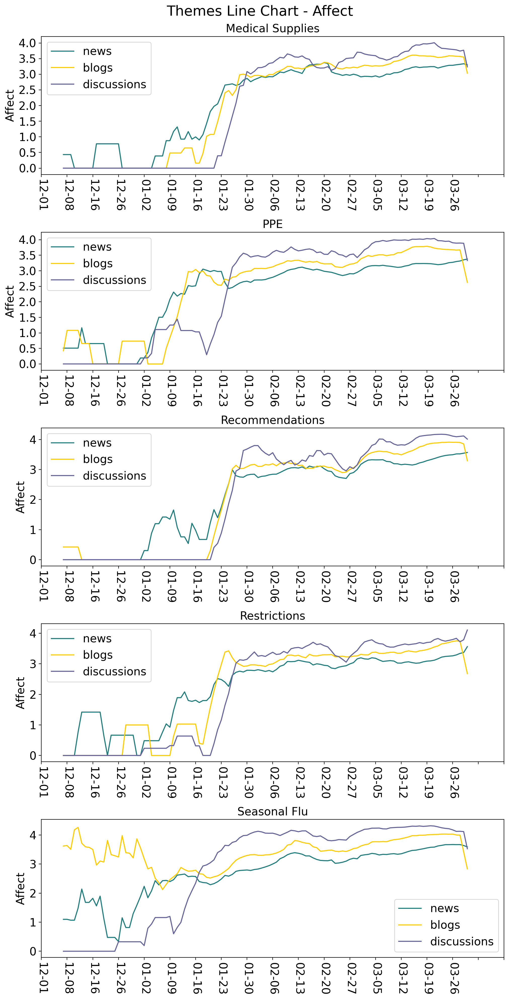

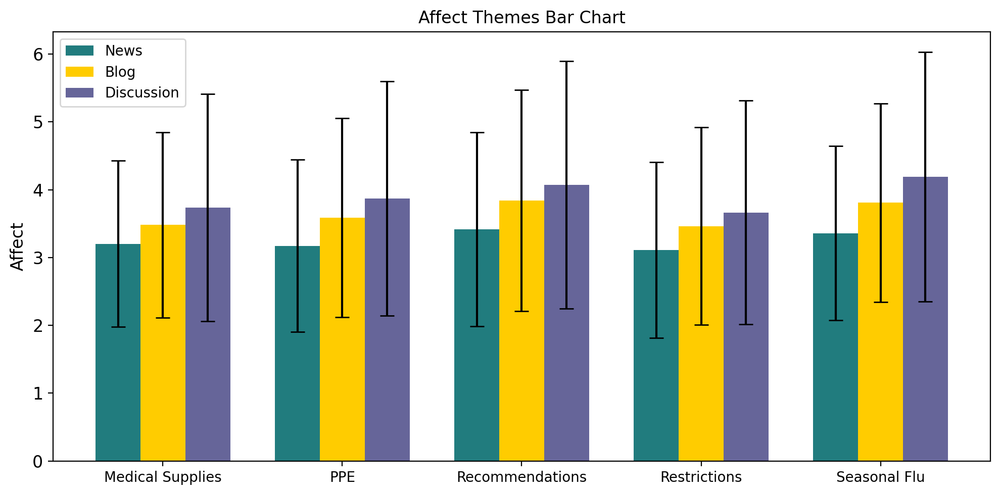

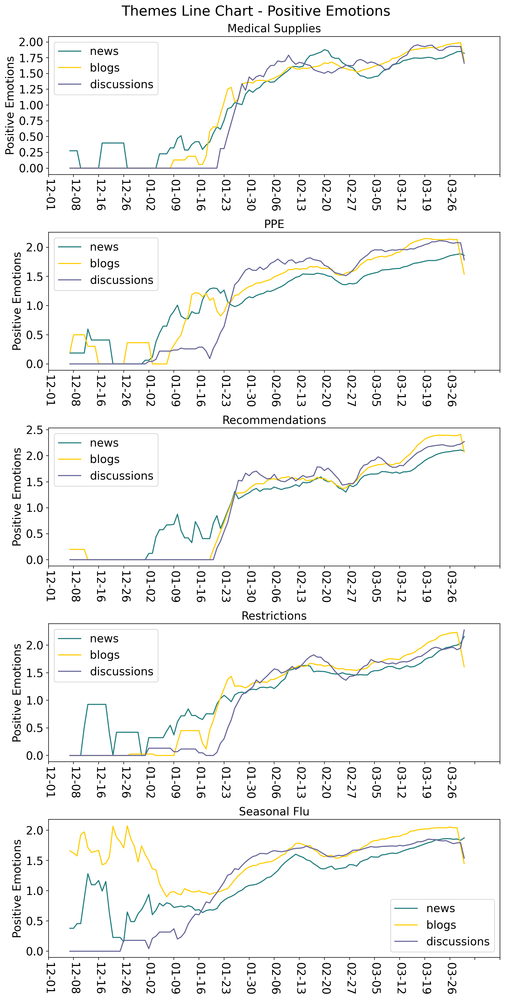

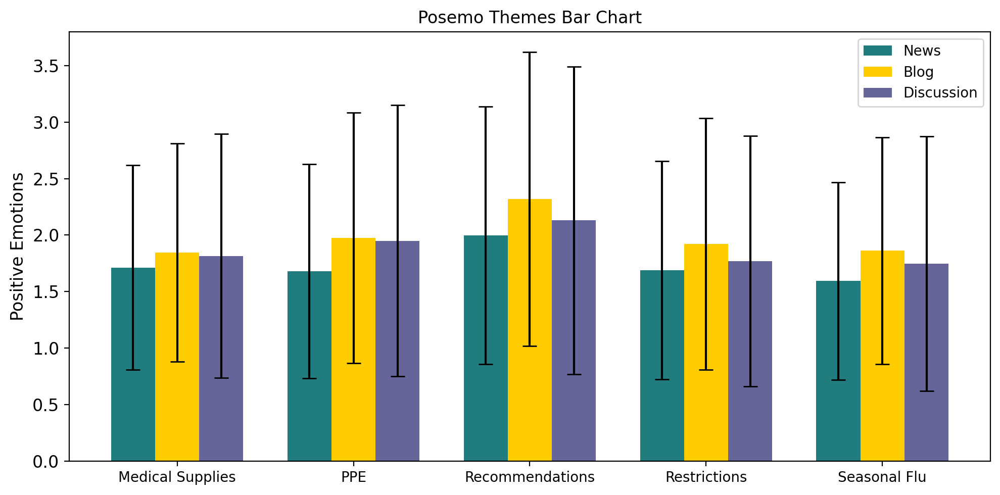

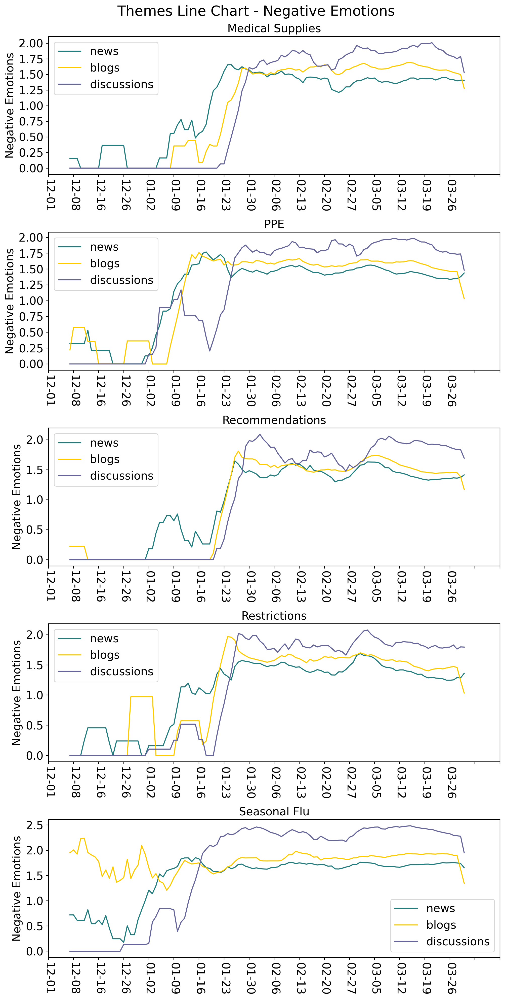

...

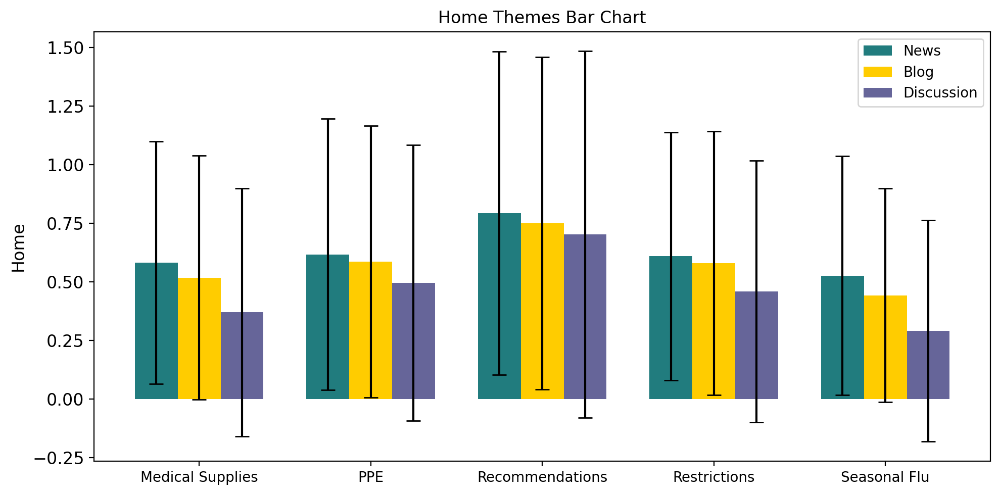

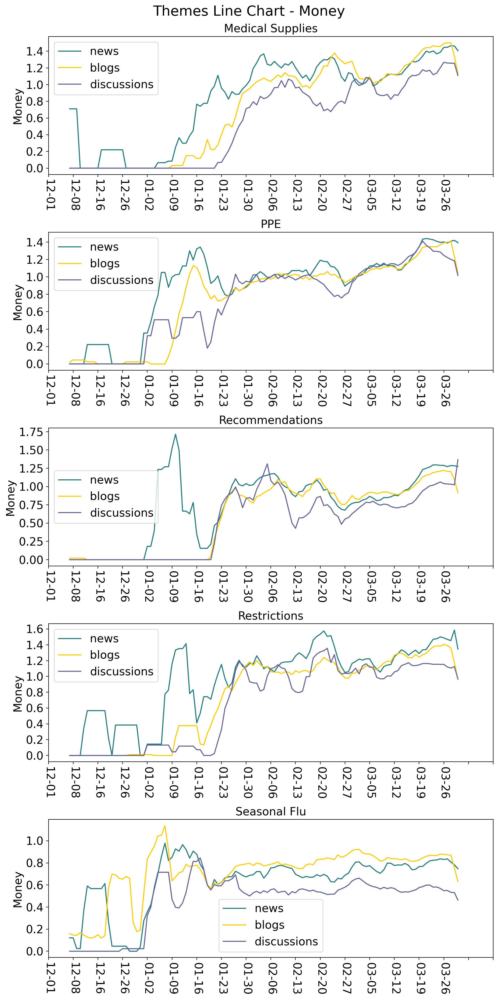

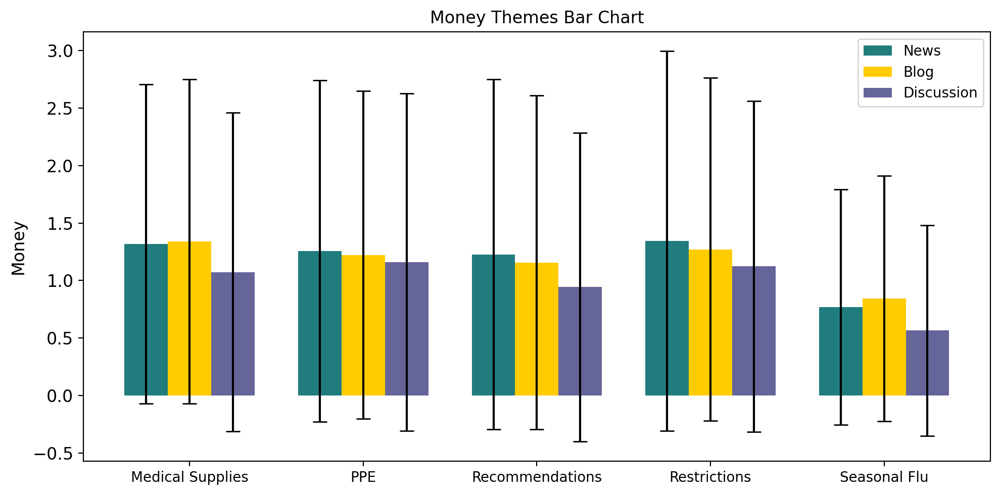

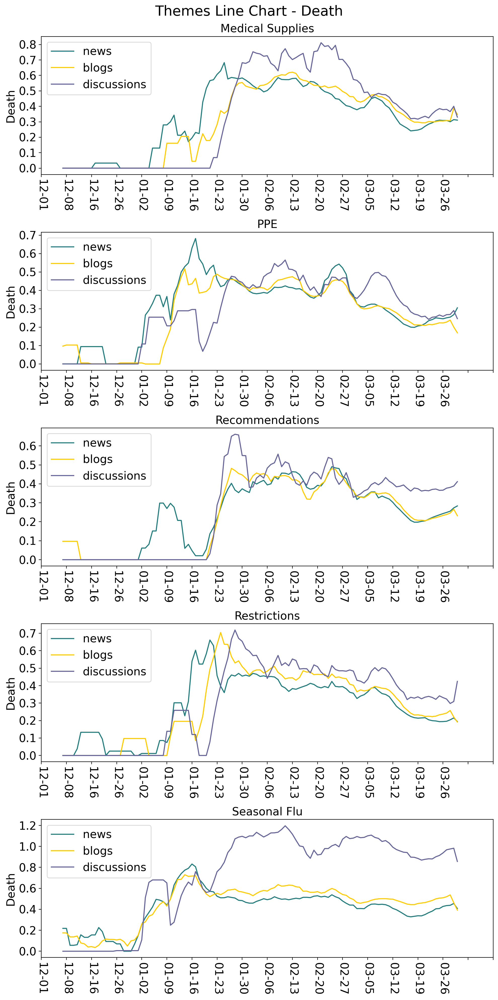

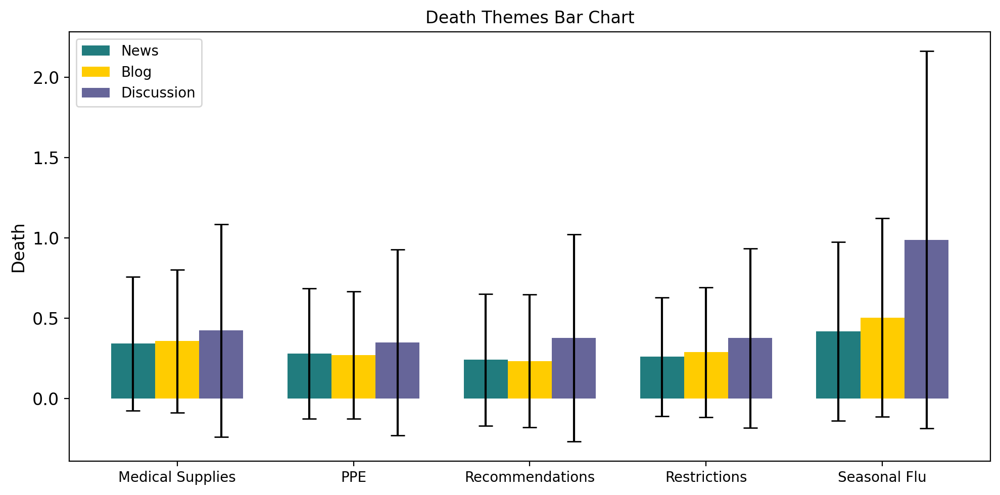

In [12]:
# metrics plot
result_pics = []
for i in metric_labels.items():
    result_pics.append(plot_metric(daily_metrics_platform_themes[i[0]],themes,i[1]))
    result_pics.append(plot_metric_bar(discr_metrics_platform_themes[i[0]],themes,i[0]))

# with ZipFile("results.zip","w") as newZip:
#     for i in result_pics:
#         newZip.write(i)

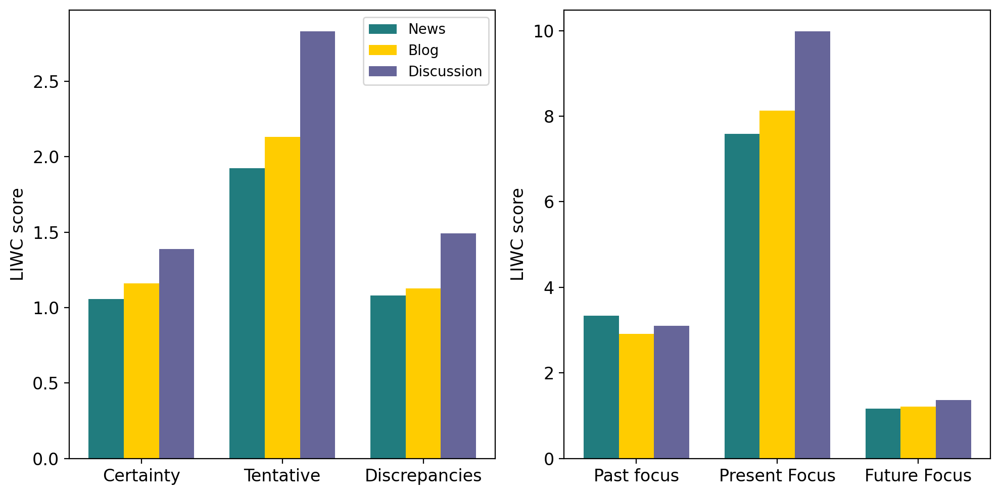

In [13]:
sets = [['certain','tentat','discrep'],['focuspast','focuspresent','focusfuture']]
metric_bar_sub(discr_metrics_platform,sets)